# Arbera Parameters

- **wrap fee**: realized when users wrap token into pod
- **unwrap fee**: realized when users unwrap token into pod.
    - Users can use the below formula to determine the quantity of TKN they can expect to receive when unwrapping pTKN; `(pTKN * CBR) * (100% - Unwrap Fee%)`
- **burn percent**: The rate at which pod fees increase the vault share of collaterlized assets per pod token. The higher the burn fee the more pTKN holders benefit and less yield is generated for pTKN LPs
- **buy fee**: This fee determines if buying pod tokens from the liquidity pool staked users are LPing to earn yield in incurs a fee.
- **sell fee**: This fee determines if selling pod tokens from the liquidity pool staked users are LPing to earn yield in incurs a fee.
- **partner fee**: This fee allows the pod creator to realize a small portion of pod tokens back for all volume through the pod.
- **collateral backing ratio**: The change in pod token collateral backing since pod creation that starts at 1. If the backing ratio is 1.1, this means there is 1.1 TKN per pTKN in the pod.
- **LP TVL**: Obtained from Uniswap pToken pool; staked pTOKEN in USD + staked pairTOKEN in USD
- **TVL**: Obtained from pTOKEN total supply value in USD + staked pairTOKEN in USD
- **Fair Price**: Price to obtain underlying token from DEX
- **Pod Price**: Price to obtain pToken
- **CBR APR (Holder APR)**: represents return for pTOKEN holders as a result of burn byproducts
- **LP APR**: return obtained through fees from LPing (i.e. from providing LP to Camelot or Uniswap)
- **WeightedIndex**: pTOKEN is ERC20 compatible "wrapped token" created for/by the Pod; holds TOKENs as they are wrapped
- **StakingPoolToken**: spTOKEN is the contract that holds CMLT-LP tokens on behalf of the Pod
- **CamelotPair**: CMLT-LP representing paired liquidity for the pTOKEN; holds pTOKEN and paired pASSET; the Pod might not hold all the LP

## Fee Distribution

```
X = Total Fees * Burn Fee %
Y = Total Fees * Partner Fee %
Z = Total Fees - (X + Y)

X = amount of pTKNs burned
Y = amount of pTKNS distributed to partner wallet (if applicable)
Z = amount used to convert and market buy $PEAS with 90% rewarded to LPs & 10% burned
```


## Simulation

For this simulation, we will use a basic stochastic model of wrapping/unwrapping.
To simplify the model, we assume all wraps/unwraps are not influenced by the address that initiates it.
Therefore, this model does not include individual actors; all wraps/unwraps are treated the same.
There is no consideration for market forces or individual differences.

## Examine Burn Rate

In [1]:
import os
import hiplot as hip
import pandas as pd

In [2]:
path = os.path.abspath('.')
filename = os.path.join(path, 'var/results.csv.gz')
df = pd.read_csv(filename)
del df['iteration']

'<!DOCTYPE html>\n\n<html>\n<head>\n<meta content="text/html;charset=utf-8" http-equiv="Content-Type"/>\n<title>HiPlot</title>\n<link href="" rel="icon"/>\n</head>\n<body style="margin:0px">\n<div id="hiplot_8d4979f50b70403e8b943fda7a5f0fc3" style="background-color: white"><div style="text-align: center">Loading HiPlot...</div>\n<noscript>\n        HiPlot needs JavaScript to run\n      </noscript>\n</div>\n<script type="text/javascript">/*! For license information please see hiplot.bundle.js.LICENSE.txt */\nvar hiplot;(function(){var __webpack_modules__={1936:function(t,e,n){"use strict";var r=n(3601),i=n.n(r),o=n(3495),a=n.n(o)()(i());a.push([t.id,".hip_thm--dark{/*!\\n * Bootstrap v4.6.0 (https://getbootstrap.com/)\\n * Copyright 2011-2021 The Bootstrap Authors\\n * Copyright 2011-2021 Twitter, Inc.\\n * Licensed under MIT (https://github.com/twbs/bootstrap/blob/main/LICENSE)\\n */@import\\"https://fonts.googleapis.com/css?family=Lato:400,700,400italic&display=swap\\"}.hip_thm--dark 
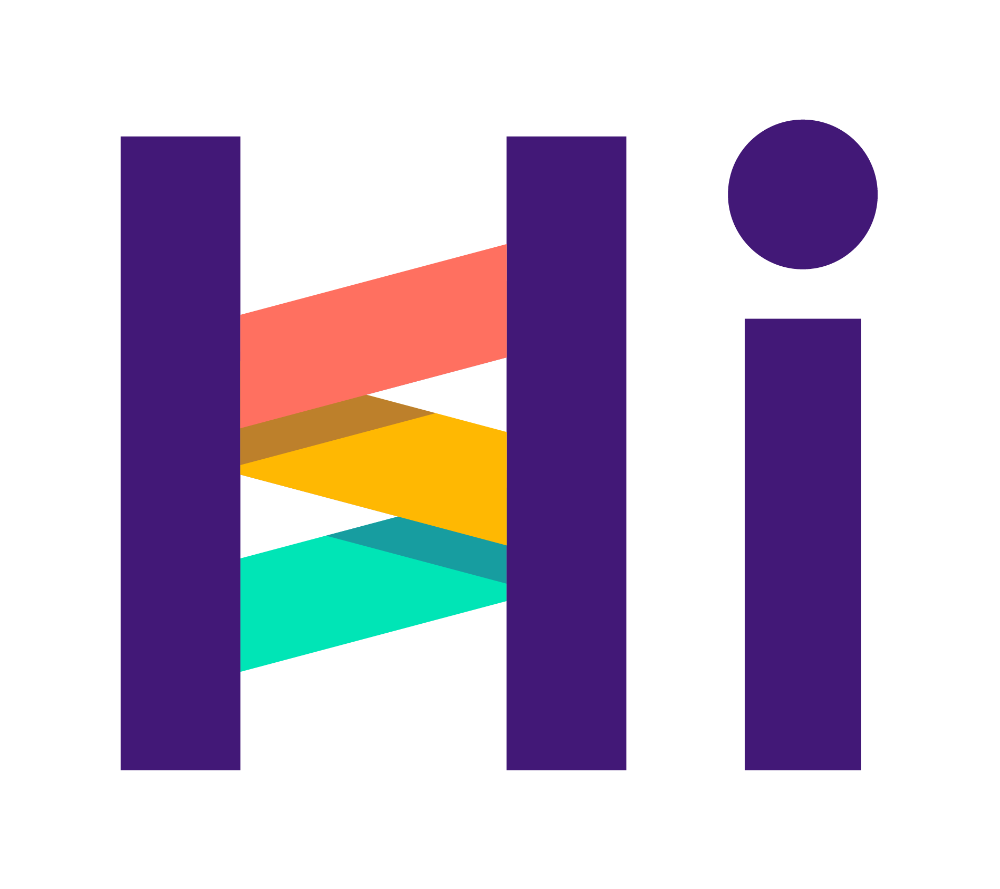

In [4]:
h = hip.Experiment.from_dataframe(df)
h.parameters_definition["cbr"].type = hip.ValueType.NUMERIC_LOG
h.to_html(os.path.join(path, 'docs/parameters.html'))